In [1]:
import xml.etree.ElementTree as ET
classes = [
    "background",
    
"fouled_plastic","packaging_bag","PE_plastic_bag","paper_waste","plastic_glass_container",
"other","leftovers","vegetable_fruit_waste","Fish_shrimp_crab","vegetable_leaves_roots","eggshell"
]

cls_dict = {i:0 for i in classes}

def read_xml_label(label_path):
    xml_label = open(label_path)
    tree = ET.parse(xml_label)
    root = tree.getroot()
    # size = root.find('size')
    # w = int(size.find('width').text)
    # h = int(size.find('height').text)
    # print(w,h)
    
    labels = []
    boxes = []

    for obj in root.iter('object'):
        difficult = obj.find('difficult').text
        cls = obj.find('name').text

        # cls_dict[cls]+=1
        # if cls not in classes or int(difficult)==1:
        #     continue
        cls_id = classes.index(cls)

        xmlbox = obj.find('bndbox')
        bbox = [
            float(xmlbox.find('xmin').text),
            float(xmlbox.find('ymin').text),
            float(xmlbox.find('xmax').text),
            float(xmlbox.find('ymax').text)]
        labels.append(cls_id)
        boxes.append(bbox)
    return labels, boxes

In [2]:
import os
import numpy as np
import torch
from PIL import Image
from torchvision.io import read_image

class MCMD_Dataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms,inference=None):
        self.root = root
        self.transforms = transforms
        self.inference = inference
        # load all image files, sorting them to
        # ensure that they are aligned
        self.imgs = list(sorted(os.listdir(os.path.join(root, "images"))))
        self.labels = list(sorted(os.listdir(os.path.join(root, "labels"))))

    def __getitem__(self, idx):
        # load images and masks
        img_path = os.path.join(self.root, "images", self.imgs[idx])
        label_path = os.path.join(self.root, "labels", self.labels[idx])
        if self.inference is not None:
            img = read_image(img_path)
            return img
        img = Image.open(img_path).convert("RGB")

        labels, boxes = read_xml_label(label_path=label_path)

        # convert everything into a torch.Tensor
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # there is only one class
        labels = torch.as_tensor(labels, dtype=torch.int64)

        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        # suppose all instances are not crowd
        iscrowd = torch.zeros((len(labels),), dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

    def __len__(self):
        return len(self.imgs)

In [6]:
from torch import nn
import torchvision
from torchvision.models.detection.retinanet import RetinaNetClassificationHead
def retinanet_res50(num_classes):
    model = torchvision.models.detection.retinanet_resnet50_fpn(pretrained=True)
    backbone = model.backbone
    anchor_generator = model.anchor_generator

    model.head.classification_head = RetinaNetClassificationHead(backbone.out_channels,
        anchor_generator.num_anchors_per_location()[0], num_classes)
        
    return model

from torchvision.models.detection.fcos import FCOSClassificationHead
def fcos_resnet50_fpn_MCMD(num_classes):
    model = torchvision.models.detection.fcos_resnet50_fpn(pretrained=True)
    backbone = model.backbone
    anchor_generator = model.anchor_generator
    model.head.classification_head = FCOSClassificationHead(backbone.out_channels, anchor_generator.num_anchors_per_location()[0], num_classes)
    return model

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor


import replace_Backbone

def get_model_object_detection(num_classes):

    # load a model pre-trained on COCO
    # model = torchvision.models.detection.fasterrcnn_resnet50_fpn(
    #     pretrained=True)
    # model = torchvision.models.detection.fasterrcnn_mobilenet_v3_large_fpn(pretrained=True)
    # model = fasterrcnn_convnext_tiny_fpn(num_classes=num_classes)
    model = replace_Backbone.fasterrcnn_efficientnet_b3(num_classes=num_classes)

    # replace the classifier with a new one, that has
    # num_classes which is user-defined
    # get number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    name = 'fasterrcnn_efficientnet_b3'
    return name, model

In [3]:
import transforms as T
import utils

def get_transform(train):
    transforms = []
    transforms.append(T.ToTensor())
    if train:
        transforms.append(T.RandomHorizontalFlip(0.5))
    return T.Compose(transforms)

In [5]:
import shutil
def save_checkpoint(state, is_best, filename='checkpoint.pth.tar', best_filename='model_best.pth.tar'):
    """Save a model checkpoint file, along with the best-performing model if applicable"""

    # if saving to an output directory, make sure it exists
    model_path = 'modelDIR'

    if not os.path.exists(model_path):
        os.mkdir(model_path)

    filename = os.path.join(model_path, filename)
    best_filename = os.path.join(model_path, best_filename)

    # save the checkpoint
    torch.save(state, filename)

    # earmark the best checkpoint
    if is_best:
        shutil.copyfile(filename, best_filename)
        print("saved best model to:  " + best_filename)
    else:
        print("saved checkpoint to:  " + filename)

In [6]:
from engine import train_one_epoch, evaluate
import utils
device = torch.device('cuda:3') if torch.cuda.is_available() else torch.device('cpu')


def main():
    # train on the GPU or on the CPU, if a GPU is not available
    
    # our dataset has two classes only - background and person
    num_classes = len(classes)
    # use our dataset and defined transformations
    dataset = MCMD_Dataset('dataset/MCMD', get_transform(train=True))
    dataset_test = MCMD_Dataset('dataset/MCMD', get_transform(train=False))

    # split the dataset in train and test set
    indices = torch.randperm(len(dataset)).tolist()
    dataset = torch.utils.data.Subset(dataset, indices[:-60])
    dataset_test = torch.utils.data.Subset(dataset_test, indices[-60:])

    bs = 8

    # define training and validation data loaders
    data_loader = torch.utils.data.DataLoader(
        dataset, batch_size=bs, shuffle=True, num_workers=4,
        collate_fn=utils.collate_fn)

    data_loader_test = torch.utils.data.DataLoader(
        dataset_test, batch_size=bs, shuffle=False, num_workers=4,
        collate_fn=utils.collate_fn)

    # get the model using our helper function
    # model = fcos_resnet50_fpn_MCMD(num_classes=num_classes)
    # model = get_model_object_detection(num_classes)
    name, model = get_model_object_detection(num_classes=num_classes)

    # move model to the right device
    model.to(device)

    # construct an optimizer
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.00395,
                                momentum=0.9, weight_decay=0.0005)
    # and a learning rate scheduler
    lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                                   step_size=10,
                                                   gamma=0.33)

    # let's train it for 10 epochs
    num_epochs = 30
    best_mAP50 = 0

    for epoch in range(num_epochs):
        # train for one epoch, printing every 10 iterations
        train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=10)
        # update the learning rate
        lr_scheduler.step()
        # evaluate on the test dataset
        result = evaluate(model, data_loader_test, device=device)


        # 每10个epoch保存一次
        if epoch % 9 == 0:
            for _, coco_eval in result.coco_eval.items():
                stats = coco_eval.stats
            mAP50 = stats[1]
            is_best = mAP50 > best_mAP50
            best_mAP50 = max(mAP50,best_mAP50)
            save_checkpoint(
                {
                    'state_dict': model.state_dict(),
                    'optimizer' : optimizer.state_dict(),
                },
                filename= f'{name}.pth.tar',
                is_best=is_best,
            )

    print("That's it!")

In [7]:
main()

Epoch: [0]  [ 0/59]  eta: 0:03:08  lr: 0.000072  loss: 2.5766 (2.5766)  loss_classifier: 1.6808 (1.6808)  loss_box_reg: 0.1020 (0.1020)  loss_objectness: 0.6898 (0.6898)  loss_rpn_box_reg: 0.1039 (0.1039)  time: 3.1912  data: 2.5322  max mem: 5938
Epoch: [0]  [10/59]  eta: 0:00:47  lr: 0.000752  loss: 1.1384 (1.4209)  loss_classifier: 0.4705 (0.7104)  loss_box_reg: 0.0998 (0.0981)  loss_objectness: 0.5543 (0.5206)  loss_rpn_box_reg: 0.0922 (0.0918)  time: 0.9674  data: 0.3687  max mem: 9768
Epoch: [0]  [20/59]  eta: 0:00:32  lr: 0.001433  loss: 1.0840 (1.2815)  loss_classifier: 0.6480 (0.7173)  loss_box_reg: 0.0855 (0.0885)  loss_objectness: 0.2959 (0.3899)  loss_rpn_box_reg: 0.0833 (0.0857)  time: 0.7188  data: 0.1341  max mem: 9768
Epoch: [0]  [30/59]  eta: 0:00:23  lr: 0.002113  loss: 0.8259 (1.0658)  loss_classifier: 0.4635 (0.5819)  loss_box_reg: 0.0665 (0.0793)  loss_objectness: 0.2168 (0.3254)  loss_rpn_box_reg: 0.0668 (0.0792)  time: 0.7254  data: 0.1354  max mem: 9768
Epoch: [

In [4]:
import torchvision.transforms.functional as F
from torchvision.utils import draw_bounding_boxes
from torchvision.transforms.functional import convert_image_dtype

def load_weitghts_inference(model):
    dataset_test = MCMD_Dataset('dataset/MCMD', transforms=None,inference='inference')
    indices = torch.randperm(len(dataset_test)).tolist()
    dataset_test = torch.utils.data.Subset(dataset_test, indices[-50:])
    imgs = []
    for i in range(10):
        img = dataset_test[i]
        imgs.append(img)

    # # 加载预训练的模型权重
    checkpoint = torch.load('modelDIR/fasterrcnn_efficientnet_b3.pth.tar')
    model.load_state_dict(checkpoint['state_dict'])
    device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
    model.to(device)

    # put the model in evaluation mode
    model.eval()
    with torch.no_grad():
        predictions = model(list(img.to(device,dtype=torch.get_default_dtype()).div(255) for img in imgs))
        return imgs, predictions

In [7]:
num_classes = len(classes)
name, model = get_model_object_detection(num_classes=num_classes)
imgs, predictions = load_weitghts_inference(model)

In [19]:
score_threshold = .8
result = []
for res in range(len(imgs)):
    scores = predictions[res]['scores'].cpu().numpy()
    boxes = predictions[res]['boxes'][predictions[res]['scores'] > score_threshold]
    labels = predictions[res]['labels'][predictions[res]['scores'] > score_threshold]
    labels = [classes[i] for i in labels]
    for i in range(len(labels)):
        labels[i] += " " + str(round(scores[i],2) )
        
    drawn_boxes = draw_bounding_boxes(imgs[res], boxes=predictions[res]['boxes']
                                      [predictions[res]['scores'] > score_threshold], labels=labels, width=4, font_size=30)
    result.append(F.to_pil_image(drawn_boxes))

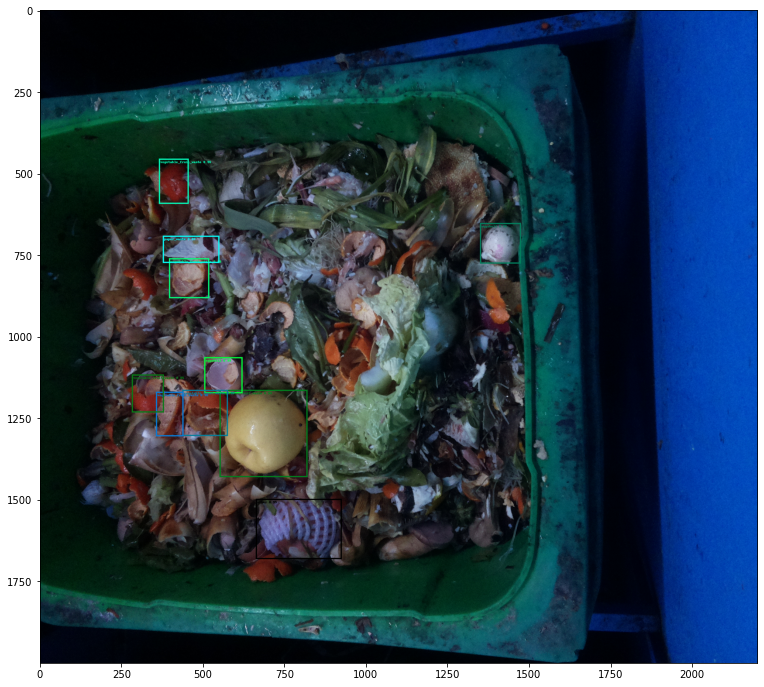

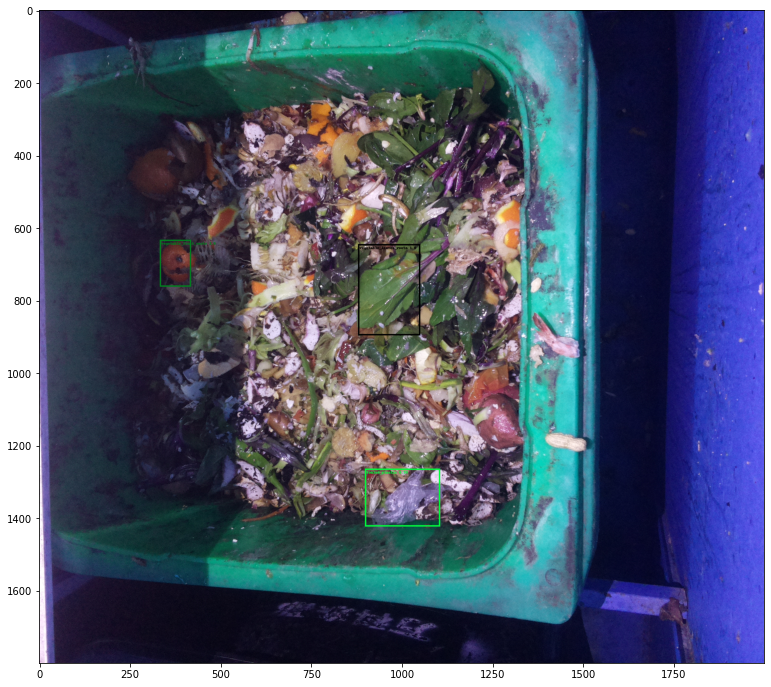

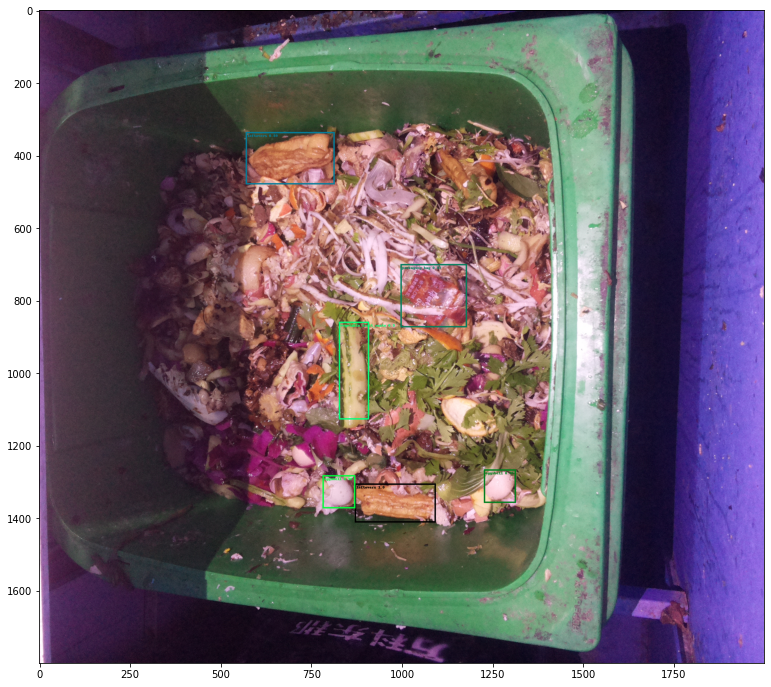

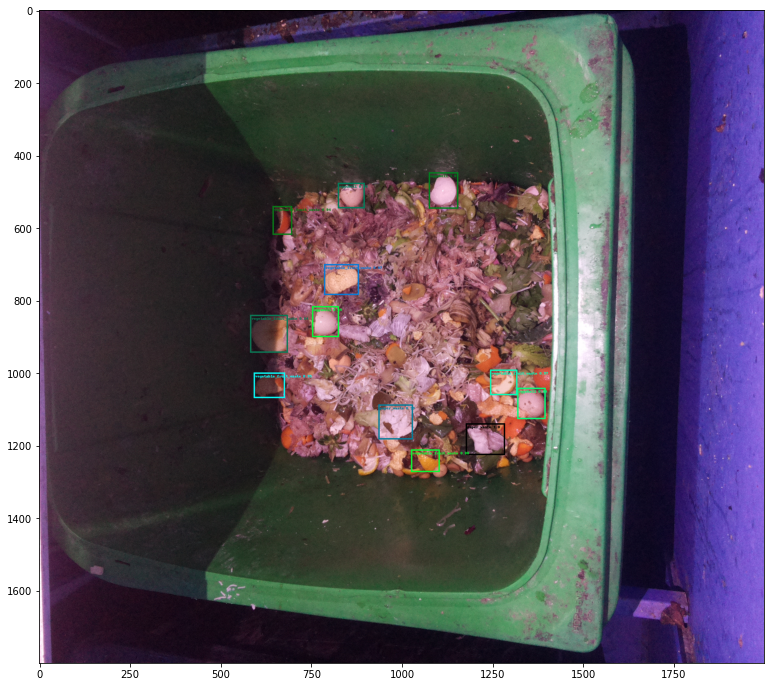

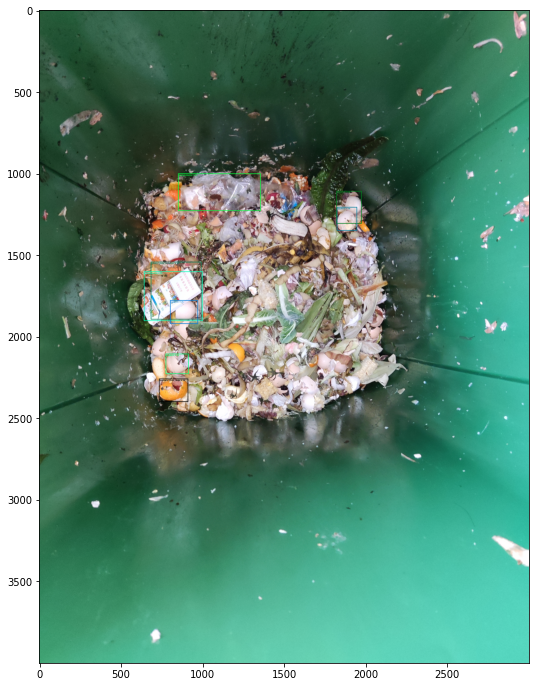

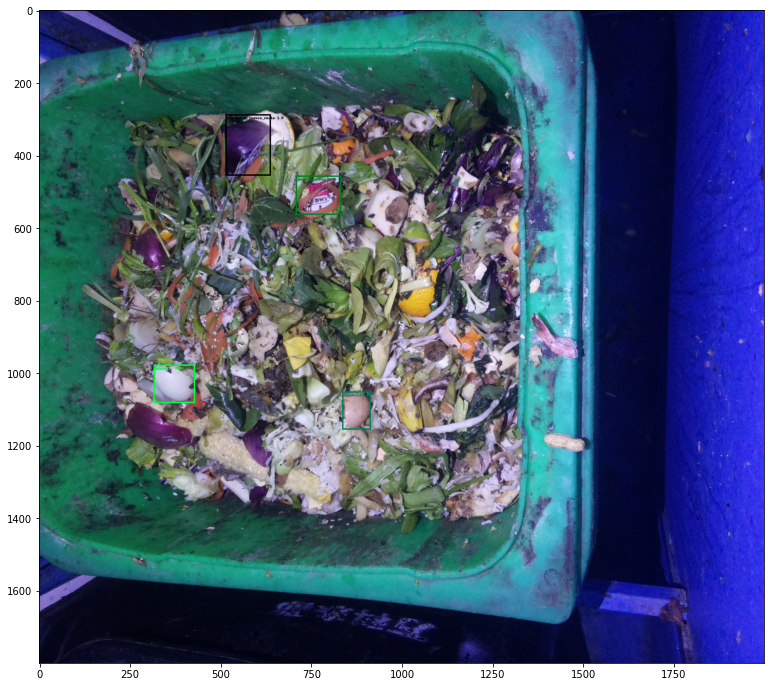

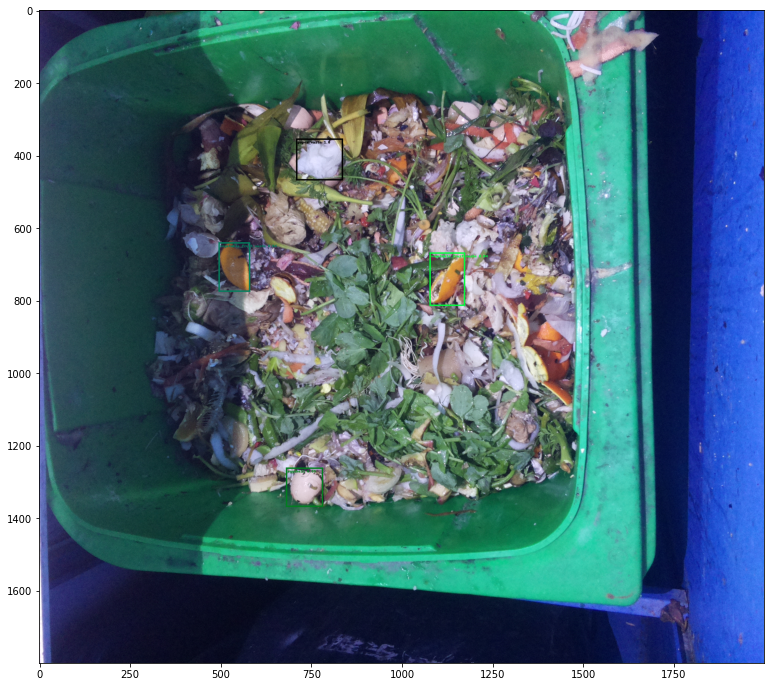

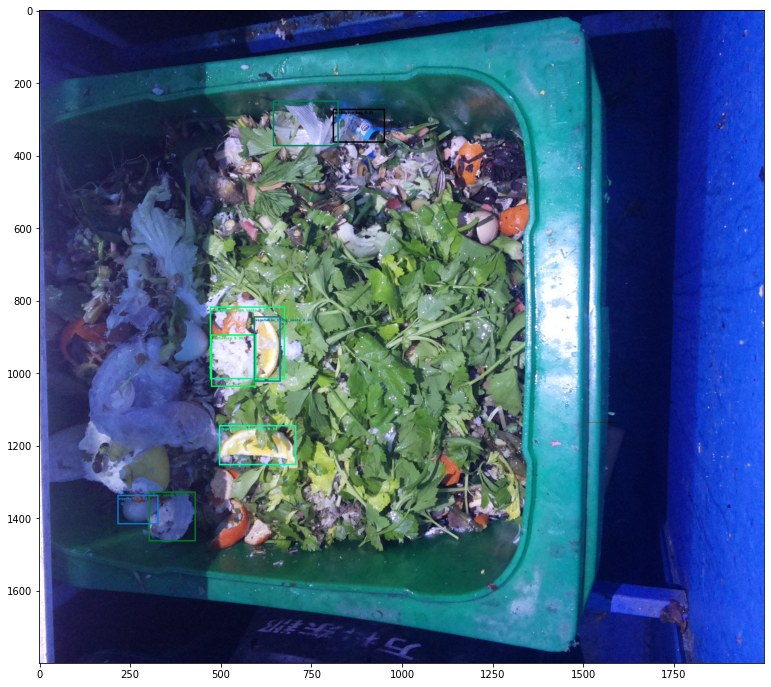

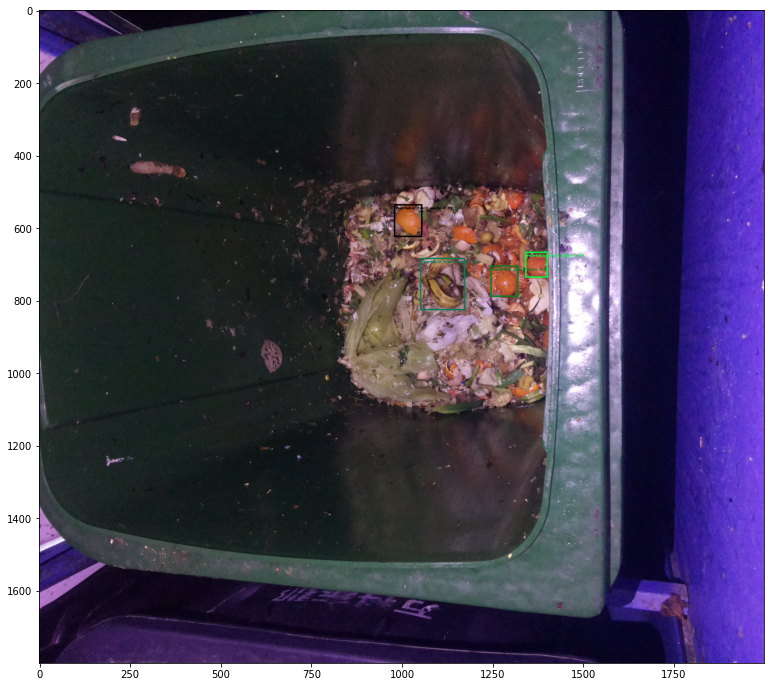

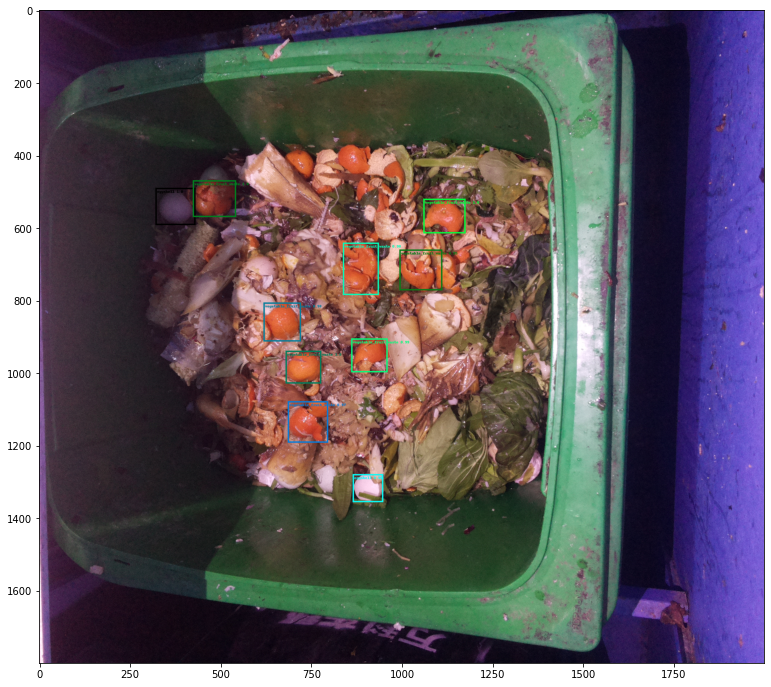

In [20]:
from matplotlib import pyplot as plt
for i in result:
    fig = plt.figure(figsize=(16, 12))
    plt.subplot(1, 1, 1)
    plt.imshow(i)

In [9]:
torch.cuda.empty_cache()

In [ ]:
from engine import train_one_epoch, evaluate
from tqdm import tqdm
import utils
import numpy as np
from sklearn.model_selection import KFold
torch.manual_seed(42)
import random
# train on the GPU or on the CPU, if a GPU is not available
device = torch.device('cuda:2') if torch.cuda.is_available() else torch.device('cpu')

def cross_validation(k_fold=5):
    
    splits=KFold(n_splits=k_fold,shuffle=True,random_state=42)
    foldperf={}
    num_classes = len(classes)
    # use our dataset and defined transformations
    dataset = MCMD_Dataset('dataset/MCMD', get_transform(train=True))
    dataset_test = MCMD_Dataset('dataset/MCMD', get_transform(train=False))

    for fold, (train_idx,val_idx) in enumerate(splits.split(np.arange(len(dataset)))):

        print('Fold {}'.format(fold + 1))
        random.shuffle(train_idx)
        random.shuffle(val_idx)

        train = torch.utils.data.Subset(dataset, train_idx)
        val = torch.utils.data.Subset(dataset_test, val_idx)

        # define training and validation data loaders
        data_loader = torch.utils.data.DataLoader(
            train, batch_size=32, shuffle=True, num_workers=8,
            collate_fn=utils.collate_fn)

        data_loader_test = torch.utils.data.DataLoader(
            val, batch_size=4, shuffle=False, num_workers=4,
            collate_fn=utils.collate_fn)

        # get the model using our helper function
        # model = fcos_resnet50_fpn_MCMD(num_classes=num_classes)
        model = get_model_object_detection(num_classes=num_classes)
        # model = get_model_object_detection(num_classes)

        # move model to the right device
        model.to(device)

        # construct an optimizer
        params = [p for p in model.parameters() if p.requires_grad]
        optimizer = torch.optim.SGD(params, lr=0.008,
                                    momentum=0.9, weight_decay=0.0005)
        # and a learning rate scheduler
        lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                                    step_size=6,
                                                    gamma=0.33)

        # let's train it for 10 epochs
        num_epochs = 36
        best_mAP50 = 0

        for epoch in tqdm(range(num_epochs)):
            # train for one epoch, printing every 10 iterations
            train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=10)
            # update the learning rate
            lr_scheduler.step()
            # evaluate on the test dataset
            result = evaluate(model, data_loader_test, device=device)

            history = {'mAP50':[], "best_mAP50": 0}
            #每10个epoch保存一次
            if epoch % 10 == 0:
                for _, coco_eval in result.coco_eval.items():
                    stats = coco_eval.stats
                mAP50 = stats[1]
                
                is_best = mAP50 > best_mAP50
                best_mAP50 = max(mAP50, best_mAP50)

                history['mAP50'].append(mAP50)
                if is_best :
                    history["best_mAP50"] = best_mAP50
                # save_checkpoint(
                #     {
                #         'state_dict': model.state_dict(),
                #         'optimizer' : optimizer.state_dict(),
                #     },
                #     is_best=is_best,
                # )

        print("That's it!")
        foldperf['fold{}'.format(fold+1)] = history
    return foldperf

In [ ]:
cross_validation()

In [ ]:
torch.cuda.empty_cache()